<div style="text-align:center;">
    <h1 style="font-family:Arial, sans-serif; font-weight:bold; color:#FF5733">Yoga Class Analysis using Human pose estimation</h1>
</div>


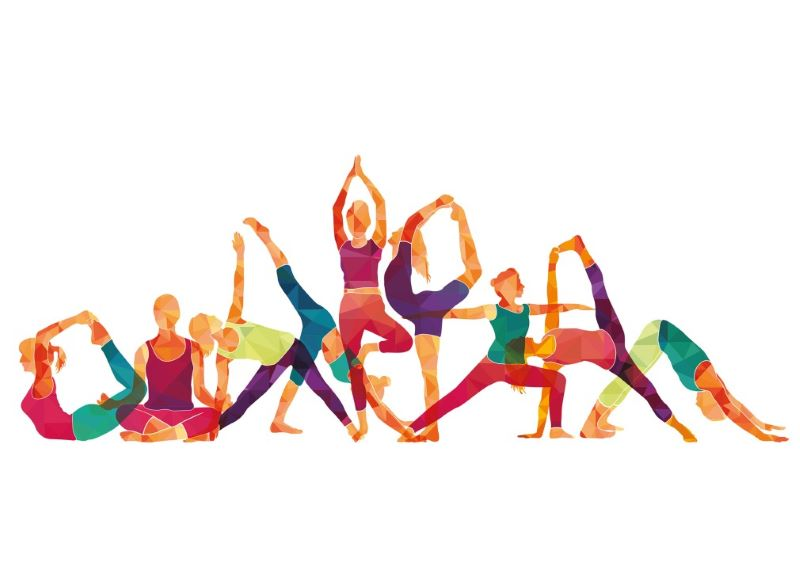



## **I.   BUSINESS UNDERSTANDING**





### **1.   Pose Estimation :**





Pose estimation is a computer vision task that is usually tackled through deep learning. It is one of the most interesting areas of research that has gained a lot of traction because of its usefulness and versatility .
It finds applications in a wide range of fields including gaming, healthcare, AR, and sports.


### **2.   What is Yoga  :**

Yoga is a physical, mental, and spiritual practice that originated in ancient India. It involves a combination of postures (asanas), breathing techniques (pranayama), and meditation. Yoga has gained popularity around the world as a form of exercise, stress relief, and spiritual practice.

Yoga postures are physical poses that are designed to stretch, strengthen, and balance the body. There are hundreds of different asanas, each with its own set of benefits and variations.
Some of the most common yoga postures include:
* **Warrior :** This pose helps to strengthen the legs, hips, and core muscles. It can also help to improve focus and concentration.
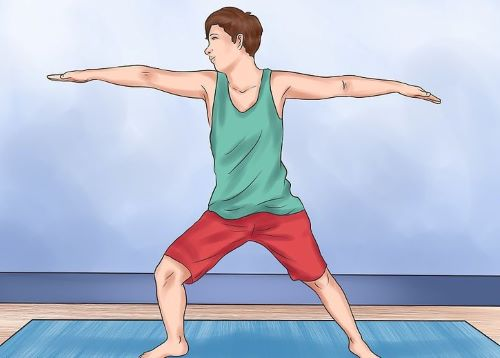

* **Tree Pose :** This balancing pose is great for improving stability and focus. It also helps to stretch the legs and hips.
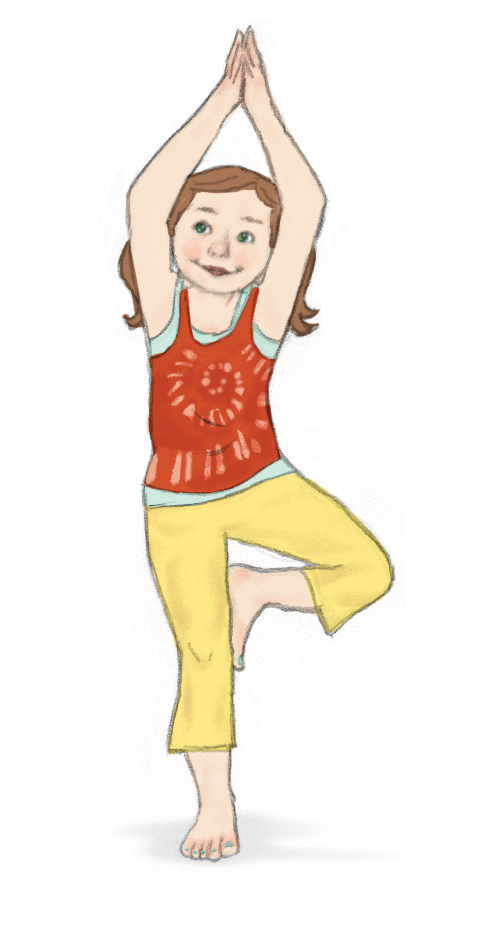

* **Plank Pose :** This pose is great for building core strength and improving posture.
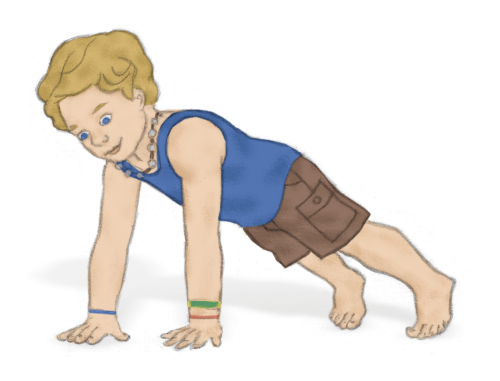

* **Goddess Pose :** This pose is often used to strengthen the legs and hips, as well as to increase flexibility.
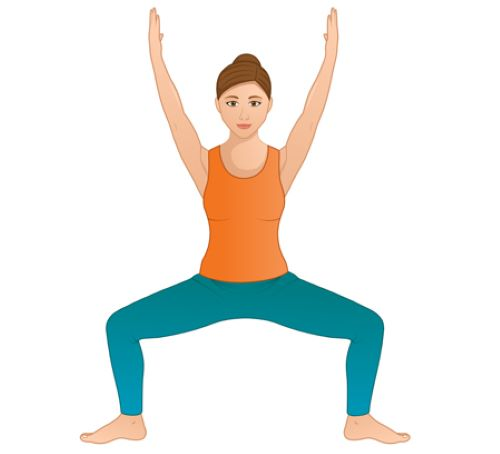

* **Downdog:**  downward-Facing Dog Pose pose is a popular yoga pose that helps to stretch the hamstrings, calves, and spine.
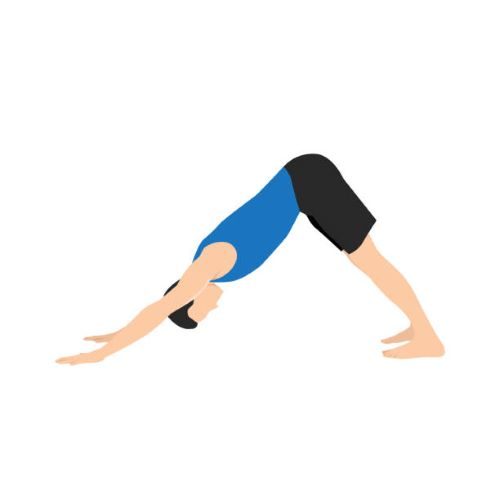

# **II.DATA UNDERSTANDING**


In [ ]:
!pip install sklearn
!pip install helper_functions
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
# Import series of helper functions for our notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, unzip_data, compare_historys, walk_through_dir, pred_and_plot


--2023-04-19 08:03:02--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: 'helper_functions.py.6'

     0K ..........                                            100% 1,12M=0,009s

2023-04-19 08:03:02 (1,12 MB/s) - 'helper_functions.py.6' saved [10246/10246]



In [ ]:
dataset = r"C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET"
walk_through_dir(dataset)

There are 2 directories and 0 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET'.
There are 5 directories and 0 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET\TEST'.
There are 0 directories and 97 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET\TEST\downdog'.
There are 0 directories and 77 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET\TEST\goddess'.
There are 0 directories and 114 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET\TEST\plank'.
There are 0 directories and 69 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET\TEST\tree'.
There are 0 directories and 109 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET\TEST\warrior2'.
There are 5 directories and 0 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET\TRAIN'.
There are 0 directories and 223 images in 'C:\Users\MY NET\Downloads\yog\YOGA\content\cleaned\DATASET\TRA

In [ ]:
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)

In [ ]:
# System libraries
import numpy as np
import pandas as pd
from pathlib import Path
import os.path

image_dir = Path(dataset)

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.JPG')) + list(image_dir.glob(r'**/*.jpg')) + list(image_dir.glob(r'**/*.png')) + list(image_dir.glob(r'**/*.png'))

labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)
labels = pd.Series(labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, labels], axis=1)

In [ ]:
image_df


,Filepath,Label
0,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,downdog
1,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,downdog
2,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,downdog
3,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,downdog
4,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,downdog
...,...,...
3075,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,warrior2
3076,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,warrior2
3077,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,warrior2
3078,C:\Users\MY NET\Downloads\yog\YOGA\content\cle...,warrior2


In [ ]:
image_df.shape

(3080, 2)

In [ ]:
image_df.columns

Index(['Filepath', 'Label'], dtype='object')

In [ ]:
image_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3080 entries, 0 to 3079
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Filepath  3080 non-null   object
 1   Label     3080 non-null   object
dtypes: object(2)
memory usage: 48.2+ KB


In [ ]:
image_df.describe

<bound method NDFrame.describe of                                                Filepath     Label
0     C:\Users\MY NET\Downloads\yog\YOGA\content\cle...   downdog
1     C:\Users\MY NET\Downloads\yog\YOGA\content\cle...   downdog
2     C:\Users\MY NET\Downloads\yog\YOGA\content\cle...   downdog
3     C:\Users\MY NET\Downloads\yog\YOGA\content\cle...   downdog
4     C:\Users\MY NET\Downloads\yog\YOGA\content\cle...   downdog
...                                                 ...       ...
3075  C:\Users\MY NET\Downloads\yog\YOGA\content\cle...  warrior2
3076  C:\Users\MY NET\Downloads\yog\YOGA\content\cle...  warrior2
3077  C:\Users\MY NET\Downloads\yog\YOGA\content\cle...  warrior2
3078  C:\Users\MY NET\Downloads\yog\YOGA\content\cle...  warrior2
3079  C:\Users\MY NET\Downloads\yog\YOGA\content\cle...  warrior2

[3080 rows x 2 columns]>

<AxesSubplot:ylabel='None'>

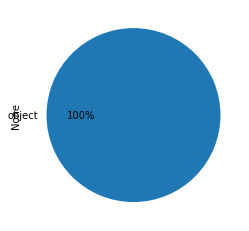

In [ ]:
image_df.dtypes.value_counts().plot.pie(autopct='%1.0f%%')

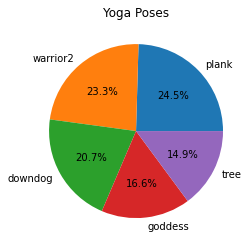

In [ ]:
import matplotlib.pyplot as plt

# Get the top 5 job titles and their frequency counts
poses = image_df['Label'].value_counts().nlargest(5)

# Create a pie chart of the top 5 job titles
plt.pie(poses.values, labels=poses.index, autopct='%1.1f%%')

# Set the chart title
plt.title('Yoga Poses')

# Display the chart
plt.show()

## CNN Model

## Libraries Import

In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import skimage
from skimage.io import imread,imshow
from skimage import transform
import os
from PIL import Image
from pathlib import Path
from matplotlib.image import imread
import cv2


In [16]:
!pip install tqdm
from tqdm import tqdm

## loading  Train data

In [3]:

labels=list()
path='C:\\Users\\User\\DATASET\\TRAIN'
os.listdir(path)
for i in os.listdir(path):
    labels.append(i)
print(labels)    

['downdog', 'goddess', 'plank', 'tree', 'warrior2']


In [7]:
#Checking the number of images
Total_sample=0
categories = []
numberof_images = []
for i in os.listdir(path):
    print(f'Length of {i}= {len(os.listdir(os.path.join(path,i)))}')
    Total_sample+=len(os.listdir(os.path.join(path,i)))
    categories.append(i)
    numberof_images.append(len(os.listdir(os.path.join(path,i))))    

print(f'Total Samples:{Total_sample}')

Length of downdog= 223
Length of goddess= 178
Length of plank= 264
Length of tree= 160
Length of warrior2= 250
Total Samples:1075


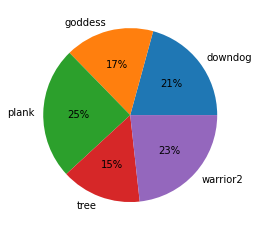

In [10]:
#pie chart visualization
plt.pie(numberof_images, labels = categories, autopct='%.0f%%')
plt.show()

## Images processing 
Resizing

In [ ]:
# img_size=224     # 224x224
# X=[] 
# Y=[]
# i=0
# for idx,img in enumerate(os.listdir(path)):
#     for img_name in tqdm(os.listdir(path+img)):
#         if i<300:
#             img_file=imread(path+img+'/'+img_name)
#             if img_file is not None:
#                 img_file=transform.resize(img_file,(img_size,img_size,3))
#                 X.append(img_file)
#                 Y.append(idx)
#         else:
#             break
#         i=i+1
#     i=0

100%|██████████| 250/250 [00:50<00:00,  4.93it/s]


In [19]:
#according to the path used, we have to make some changes 
img_size = 224     # 224x224
X = [] 
Y = []
i = 0
for idx, img in enumerate(os.listdir(path)):
    for img_name in tqdm(os.listdir(path + '\\' + img)):
        if i < 300:
            img_file = cv2.imread(path + '\\' + img + '\\' + img_name)
            if img_file is not None:
                img_file = cv2.resize(img_file, (img_size, img_size))
                X.append(img_file)
                Y.append(idx)
        else:
            break
        i = i+1
    i = 0

100%|██████████| 250/250 [00:19<00:00, 13.15it/s]


Scaling

In [20]:
X_train=np.asarray(X)
Y_train=np.asarray(Y)

In [21]:
X_train[0]


array([[[240, 239, 243],
        [241, 240, 244],
        [241, 240, 244],
        ...,
        [248, 247, 249],
        [248, 247, 249],
        [249, 248, 250]],

       [[240, 239, 243],
        [241, 240, 244],
        [241, 240, 244],
        ...,
        [248, 247, 249],
        [248, 247, 249],
        [248, 247, 249]],

       [[240, 239, 243],
        [241, 240, 244],
        [241, 240, 244],
        ...,
        [248, 247, 249],
        [248, 247, 249],
        [247, 246, 248]],

       ...,

       [[232, 231, 241],
        [232, 231, 241],
        [233, 232, 242],
        ...,
        [249, 249, 255],
        [249, 249, 255],
        [248, 248, 254]],

       [[232, 231, 240],
        [232, 231, 240],
        [233, 232, 241],
        ...,
        [249, 249, 255],
        [249, 249, 255],
        [247, 250, 255]],

       [[232, 231, 240],
        [232, 231, 240],
        [233, 232, 241],
        ...,
        [249, 249, 255],
        [249, 249, 255],
        [247, 250, 255]]

# Visualizations


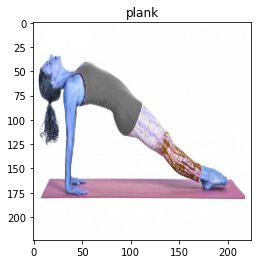

In [22]:
plt.imshow(X[402])
plt.title(labels[Y[402]])
plt.show()

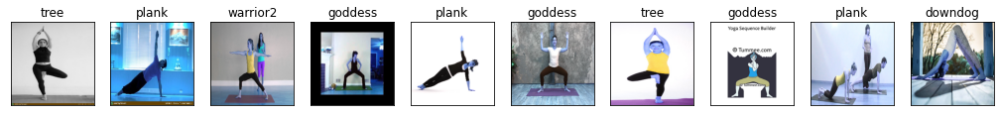

In [23]:
from random import randint
n = 50  
plt.figure(figsize=(90,40))
for i in range(10,20):
    rn=randint(0,987)
    ax = plt.subplot(1, n, i + 1)
    plt.imshow(X[rn])
    plt.title(labels[Y[rn]])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()
plt.close()

## loading  Test data

In [11]:
test_labels=list()
Tpath='C:\\Users\\User\\DATASET\\TEST'
os.listdir(Tpath)
for i in os.listdir(Tpath):
    test_labels.append(i)
print(test_labels)    

['downdog', 'goddess', 'plank', 'tree', 'warrior2']


In [12]:
#Checking the number of images
Total_sample=0
categories = []
numberof_images = []
for i in os.listdir(Tpath):
    print(f'Length of :{i}= {len(os.listdir(os.path.join(Tpath,i)))}')
    Total_sample+=len(os.listdir(os.path.join(Tpath,i)))
    categories.append(i)
    numberof_images.append(len(os.listdir(os.path.join(Tpath,i))))    

print(f'Total Samples:{Total_sample}')

Length of :downdog= 97
Length of :goddess= 77
Length of :plank= 114
Length of :tree= 69
Length of :warrior2= 109
Total Samples:466


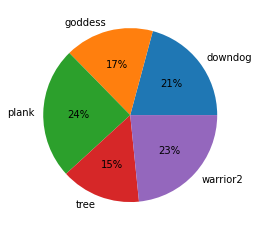

In [13]:
#pie chart visualization
plt.pie(numberof_images, labels = categories, autopct='%.0f%%')
plt.show()

In [ ]:
# img_size=224     # 224x224
# X_test=[] 
# Y_test=[]
# i=0
# for idx,img in enumerate(os.listdir(Tpath)):
#     for img_name in tqdm(os.listdir(Tpath+img)):
#         if i<300:
#             img_file=imread(Tpath+img+'/'+img_name)
#             if img_file is not None:
#                 img_file=transform.resize(img_file,(img_size,img_size,3))
#                 X_test.append(img_file)
#                 Y_test.append(idx)
#         else:
#             break
#         i=i+1
#     i=0

100%|██████████| 109/109 [00:27<00:00,  3.93it/s]


In [24]:
#according to the path used, we have to make some changes 
img_size=224     # 224x224
X_test=[] 
Y_test=[]
i=0
for idx,img in enumerate(os.listdir(Tpath)):
    for img_name in tqdm(os.listdir(Tpath+'\\'+img)):
        if i<300:
            img_file=imread(Tpath+ '\\' + img + '\\' + img_name)
            if img_file is not None:
                img_file=transform.resize(img_file,(img_size,img_size,3))
                X_test.append(img_file)
                Y_test.append(idx)
        else:
            break
        i=i+1
    i=0

100%|██████████| 109/109 [02:17<00:00,  1.26s/it]


In [25]:
X_test=np.asarray(X_test)
Y_test=np.asarray(Y_test)

# Visualizations

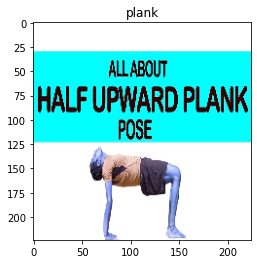

In [26]:
plt.imshow(X[401])
plt.title(labels[Y[401]])
plt.show()

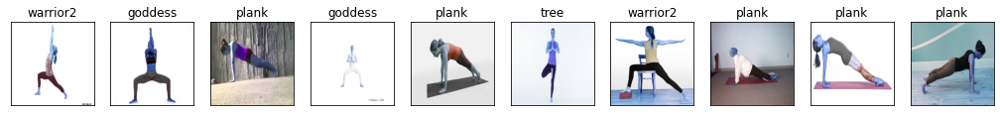

In [27]:
from random import randint
n = 50  
plt.figure(figsize=(90,40))
for i in range(10,20):
    rn=randint(0,987)
    ax = plt.subplot(1, n, i + 1)
    plt.imshow(X[rn])
    plt.title(labels[Y[rn]])
    plt.gray()
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.show()
plt.close()

## Building CNN Model

 We'll split our training data into train data and validation  data and use the testing data to evaluate our model later. 

In [28]:
from sklearn.model_selection import train_test_split
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.25, stratify=Y_train,random_state=42)

In [29]:
# OneHot-Encoding
from keras.utils.np_utils import to_categorical
Y_train=to_categorical(Y_train,num_classes=len(labels))
Y_val=to_categorical(Y_val,num_classes=len(labels))
Y_test=to_categorical(Y_test,num_classes=len(labels))

In [30]:
print('Shapes of Data Split into Train & Validation & Test Part')
print(f'Training Data->{X_train.shape},{Y_train.shape} Testing Data->{X_test.shape,Y_test.shape} Validation Data->{X_val.shape,Y_val.shape}')

Shapes of Data Split into Train & Validation & Test Part
Training Data->(806, 224, 224, 3),(806, 5) Testing Data->((466, 224, 224, 3), (466, 5)) Validation Data->((269, 224, 224, 3), (269, 5))


In [31]:
Y_train.shape,Y_val.shape,Y_test.shape

((806, 5), (269, 5), (466, 5))

# Grid Search to find the best Hyper Parameters


In [35]:
#Imports and defining Hyperparamater space
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import SGD
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout

param_grid = {
    'batch_size': [32],
    'epochs': [15],
    'optimizer': [Adam, RMSprop,SGD],
    'learning_rate': [0.01, 0.001, 0.0001],
    
}

In [36]:
#preparing the create model function to be used in the kerasclassifier
def create_model(optimizer='adam', learning_rate=0.001, dropout=0.2):
    model = Sequential([
        Conv2D(64, (5, 5), padding='same', activation='relu', input_shape=(224, 224, 3)),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(32, (4, 4), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(128, (3, 3), padding='same', activation='relu'),
        MaxPooling2D(pool_size=(2, 2)),
        Conv2D(50, (3, 3), padding='same', activation='relu'),
        Flatten(),
        Dense(64, activation='relu'),
        Dropout(dropout),
        Dense(len(labels), activation='softmax')
    ])
    opt = optimizer(learning_rate=learning_rate)
    model.compile(loss='categorical_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

In [37]:
#creating instance of Kerasclassifier and gridsearchCV
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier


model = KerasClassifier(build_fn=create_model)

grid = GridSearchCV(estimator=model, param_grid=param_grid, n_jobs=None)

C:\Users\User\AppData\Local\Temp\ipykernel_14816\4009726983.py:6: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasClassifier(build_fn=create_model)


In [ ]:
#Finding the Grid results
grid_result = grid.fit(X_train, Y_train, validation_data=(X_val, Y_val), verbose=2)


In [ ]:
#Finding the best parameters 
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))


In [ ]:
# CNN Libraries
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Flatten,Conv2D,MaxPooling2D

model = Sequential([
    Conv2D(64, (5, 5), padding='same', activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(32, (4, 4), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), padding='same', activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(50, (3, 3), padding='same', activation='relu'),
    Flatten(),
    Dense(64, activation='relu'),
    Dense(len(labels), activation='softmax') # Multi-class Classification Problem
])
model.compile(loss='categorical_crossentropy',optimizer='adam'
             ,metrics=['accuracy'])

In [ ]:
epoch=5
history = model.fit(X_train, Y_train, validation_data=(X_test, Y_test), epochs=epoch, batch_size=32, verbose=2)


Epoch 1/5
34/34 - 56s - loss: 0.0048 - accuracy: 0.9981 - val_loss: 1.7170 - val_accuracy: 0.8090 - 56s/epoch - 2s/step
Epoch 2/5
34/34 - 59s - loss: 0.0069 - accuracy: 0.9991 - val_loss: 1.6630 - val_accuracy: 0.7983 - 59s/epoch - 2s/step
Epoch 3/5
34/34 - 57s - loss: 0.0028 - accuracy: 0.9981 - val_loss: 1.7085 - val_accuracy: 0.8047 - 57s/epoch - 2s/step
Epoch 4/5
34/34 - 60s - loss: 0.0066 - accuracy: 0.9991 - val_loss: 1.5801 - val_accuracy: 0.7854 - 60s/epoch - 2s/step
Epoch 5/5
34/34 - 61s - loss: 0.0041 - accuracy: 0.9981 - val_loss: 1.6211 - val_accuracy: 0.8047 - 61s/epoch - 2s/step


In [ ]:
model.save('CNN_yoga.h5')

In [ ]:
score=model.evaluate(X_test,Y_test,verbose=1)

15/15 [==============================] - 6s 373ms/step - loss: 1.6211 - accuracy: 0.8047


# Confusion Matrix

15/15 [==============================] - 4s 286ms/step


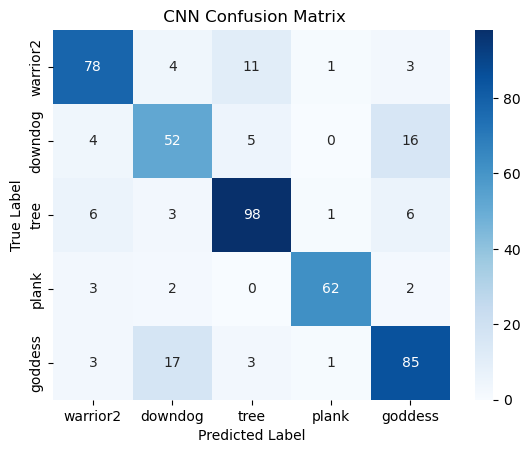

In [ ]:
y_pred=model.predict(X_test)
y_pred=np.argmax(y_pred,axis=1)
Y_t=np.argmax(Y_test,axis=1)
import seaborn as sns
from sklearn import metrics
cm=metrics.confusion_matrix(Y_t,y_pred)
class_names = ['warrior2', 'downdog', 'tree', 'plank', 'goddess']
# Plot confusion matrix using seaborn
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(' CNN Confusion Matrix')
plt.show()

## MoveNet Model

## imports and downloads

In [ ]:
pip install tensorflow_hub


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install wget

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9676 sha256=326ef2ece99f5de8ce014fbf2a48b63651ca90ae4092e3063f67343597ce1731
  Stored in directory: /root/.cache/pip/wheels/04/5f/3e/46cc37c5d698415694d83f607f833f83f0149e49b3af9d0f38
Successfully built wget


In [ ]:
import csv
import cv2 
import itertools
import numpy as np
import pandas as pd
import os
import sys
import tempfile
import tqdm

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow import keras

from matplotlib import pyplot as plt
from matplotlib.collections import LineCollection

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

model_path = 'movenet_thunder.tflite'

# Download model from TF Hub and check out inference code from GitHub
!wget -q -O movenet_thunder.tflite https://tfhub.dev/google/lite-model/movenet/singlepose/thunder/tflite/float16/4?lite-format=tflite
!git clone https://github.com/tensorflow/examples.git
pose_sample_rpi_path = os.path.join(os.getcwd(), 'examples/lite/examples/pose_estimation/raspberry_pi')
sys.path.append(pose_sample_rpi_path)

# Load MoveNet Thunder model
import utils
from data import BodyPart
from ml import Movenet
movenet = Movenet('movenet_thunder')




Cloning into 'examples'...
remote: Enumerating objects: 23096, done.
remote: Counting objects: 100% (58/58), done.
remote: Compressing objects: 100% (48/48), done.
remote: Total 23096 (delta 17), reused 41 (delta 9), pack-reused 23038
Receiving objects: 100% (23096/23096), 42.18 MiB | 11.88 MiB/s, done.
Resolving deltas: 100% (12666/12666), done.
Updating files: 100% (2762/2762), done.


In [ ]:

# Define function to run pose estimation using MoveNet Thunder
def detect(input_tensor, inference_count=3):
  """Runs detection on an input image.
  Args:
    input_tensor: A [height, width, 3] tensor of type tf.float32.
        Note that height and width can be anything since the image 
        will be immediately resized according to the needs of the 
        model within this function.
    inference_count: Number of times the model should run repeatedly
        on the same input image to improve detection accuracy.
      
  Returns:
    A person entity detected by the MoveNet.SinglePose
  """
  image_height, image_width, channel = input_tensor.shape

  # Detect pose using the full input image
  movenet.detect(input_tensor.numpy(), reset_crop_region=True)

  # Repeatedly using previous detection result to identify the
  # region of interest and only cropping that region to improve
  # detection accuracy
  for _ in range(inference_count - 1):
    person = movenet.detect(input_tensor.numpy(),
                            reset_crop_region=False)
    
  return person
  
  # title functions to visualize the pose estimation results

def draw_prediction_on_image(
    image, person, crop_region=None, close_figure=True,
    keep_input_size=False):
  """Draws the keypoint predictions on image.
  Args:
  image: A numpy array with shape [height, width, channel] representing 
      the pixel values of the input image.
  person: A person entity returned from the MoveNet.SinglePose model.
  close_figure: Whether to close the plt figure after the function returns.
  keep_input_size: Whether to keep the size of the input image.
  Returns:
    A numpy array with shape [out_height, out_width, channel] representing
    the image overlaid with keypoint predictions. 
  """
  # Draw the detection result on top of the image. 
  image_np = utils.visualize(image, [person])

  # Plot the image with detection results.
  height, width, channel = image.shape
  aspect_ratio = float(width) / height 
  fig, ax = plt.subplots(figsize=(12 * aspect_ratio, 12))
  im = ax.imshow(image_np)

  if close_figure:
    plt.close(fig)

  if not keep_input_size:
    image_np = utils.keep_aspect_ratio_resizer(image_np, (512, 512))

  return image_np
  
  # Load images, detect pose landmarks and save to CSV 
class MoveNetPreprocessor(object):
  """Helper class to preprocess pose sample images for classification."""
  
  def __init__(self,
               images_in_folder,
               images_out_folder,
               csvs_out_path):
    """Creates a preprocessor to detect pose from images and save as csv.
    Args:
      images_in_folder: Path to folder with input images. It should follow 
          this structure:
          yoga_poses
          |__ downdog
              |______ 00000128.jpg
              |______ 00000181.bmp
              |______ ...
          |__ goddess
              |______ 00000243.jpg
              |______ 00000306.jpg
              |______ ...
          ...
      images_out_folder: Path to write the images overlay with detected
          landmarks. These images are useful when you need to debug 
          accuracy issues.
      csvs_out_path: Path to write the CSV containing the detected landmark
          coordinates and label of each image than can be used to train a 
          pose classification model. 
    """
    self._images_in_folder = images_in_folder
    self._images_out_folder = images_out_folder
    self._csvs_out_path = csvs_out_path
    self._messages = []

    # Create a temp dir to store the pose CSVs per class
    self._csvs_out_folder_per_class = tempfile.mkdtemp()

    # Get list of pose classes and print image statistics 
    self._pose_class_names = sorted(
        [n for n in os.listdir(self._images_in_folder) if not \
         n.startswith('.')])
    
  def process(self, per_pose_class_limit=None, detection_threshold=0.1):
    """Preprocesses images in the given folder.
    Args:
      per_pose_class_limit: No. images to load.
      detection_threshold: Only keep images with all landmark confidence
          score above this threshold
    """
    # Loop through the classes and preprocess its images
    for pose_class_name in self._pose_class_names:
      print('Preprocessing', pose_class_name, file=sys.stderr)

      # Paths for the pose class
      images_in_folder = os.path.join(self._images_in_folder, pose_class_name)
      images_out_folder = os.path.join(self._images_out_folder, pose_class_name)
      csv_out_path = os.path.join(self._csvs_out_folder_per_class, 
                                  pose_class_name + '.csv')
      
      # create images_out_folder if it does not exist
      if not os.path.exists(images_out_folder):
        os.makedirs(images_out_folder)

      # Detect landmarks in each image and write it to a CSV file
      with open(csv_out_path, 'w') as csv_out_file:
        csv_out_writer = csv.writer(csv_out_file, 
                                    delimiter=',',
                                    quoting=csv.QUOTE_MINIMAL)
        # Get list of images
        image_names = sorted(
            [n for n in os.listdir(images_in_folder) if not n.startswith('.')])
        if per_pose_class_limit is not None:
          image_names = image_names[:per_pose_class_limit]

        valid_image_count = 0

        # Detect pose landmarks from each image
        for image_name in tqdm.tqdm(image_names):
          image_path = os.path.join(images_in_folder, image_name)

          try:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
          except:
            self._messages.append('Skipped ' + image_path + '. Invalid image.')
            continue
          else:
            image = tf.io.read_file(image_path)
            image = tf.io.decode_jpeg(image)
            image_height, image_width, channel = image.shape

          # Skip images that aren't RGB. Requires RGB images.
          if channel != 3:
            self._messages.append('Skipped ' + image_path + 
                                  '. Image isn\'t in RGB format.')
            continue
          person = detect(image)

          # Save landmarks if all landmarks were detected 
          min_landmarks_score = min(
              [keypoint.score for keypoint in person.keypoints])
          should_keep_image = min_landmarks_score >= detection_threshold
          if not should_keep_image:
            self._messages.append('Skipped ' + image_path + 
                                  '. No pose was confidentally detected.')
            continue
          
          valid_image_count += 1

          # Draw the prediction result on top of the image
          output_overlay = draw_prediction_on_image(
              image.numpy().astype(np.uint8), person, 
              close_figure=True, keep_input_size=True)
          
          # Write detection result into an image file
          output_frame = cv2.cvtColor(output_overlay, cv2.COLOR_RGB2BGR)
          cv2.imwrite(os.path.join(images_out_folder, image_name), output_frame)

          # Get landmarks and scale it to the same size as the input image
          pose_landmarks = np.array(
              [[keypoint.coordinate.x, keypoint.coordinate.y, keypoint.score]
              for keypoint in person.keypoints],
              dtype=np.float32)
          
          # Write landmark coordinates to its per-class CSV file
          coordinates = pose_landmarks.flatten().astype(str).tolist()
          csv_out_writer.writerow([image_name] + coordinates)

        if not valid_image_count:
          raise RuntimeError(
              'No valid images for the "{}" class.'
              .format(pose_class_name))
    
    # Print the error message collected during preprocessing 
    print('\n'.join(self._messages))

    # Combine all per-class CSVs into a single output file
    all_landmarks_df = self._all_landmarks_as_dataframe()
    all_landmarks_df.to_csv(self._csvs_out_path, index=False)

  def class_names(self):
    """List of classes found in the training dataset."""
    return self._pose_class_names

  def _all_landmarks_as_dataframe(self):
    """Merge all per-class CSVs into a single dataframe."""
    total_df = None
    for class_index, class_name in enumerate(self._pose_class_names):
      csv_out_path = os.path.join(self._csvs_out_folder_per_class,
                                  class_name + '.csv')
      per_class_df = pd.read_csv(csv_out_path, header=None)

      # Add the labels
      per_class_df['class_no'] = [class_index]*len(per_class_df)
      per_class_df['class_name'] = [class_name]*len(per_class_df)

      # Append the folder name to the filename column
      per_class_df[per_class_df.columns[0]] = (os.path.join(class_name, '')
      + per_class_df[per_class_df.columns[0]].astype(str))

      if total_df is None:
        # For the first class, assign its data to the total dataframe
        total_df = per_class_df
      else:
        # Concatenate each class's data into the total dataframe
        total_df = pd.concat([total_df, per_class_df], axis=0)

    list_name = [[bodypart.name + '_x', bodypart.name + '_y', 
                  bodypart.name + '_score'] for bodypart in BodyPart]

    header_name = []
    for columns_name in list_name:
      header_name += columns_name
    header_name = ['file_name'] + header_name 
    header_map = {total_df.columns[i]: header_name[i]
                  for i in range(len(header_name))}

    total_df.rename(header_map, axis=1, inplace=True)

    return total_df     


--2023-04-18 23:42:51--  https://cdn.pixabay.com/photo/2017/03/03/17/30/yoga-2114512_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.14.16, 104.18.15.16, 2606:4700::6812:f10, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.14.16|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 29024 (28K) [binary/octet-stream]
Saving to: ‘/tmp/image.jpeg’

/tmp/image.jpeg     100%[===================>]  28.34K  --.-KB/s    in 0s      

2023-04-18 23:42:51 (85.5 MB/s) - ‘/tmp/image.jpeg’ saved [29024/29024]



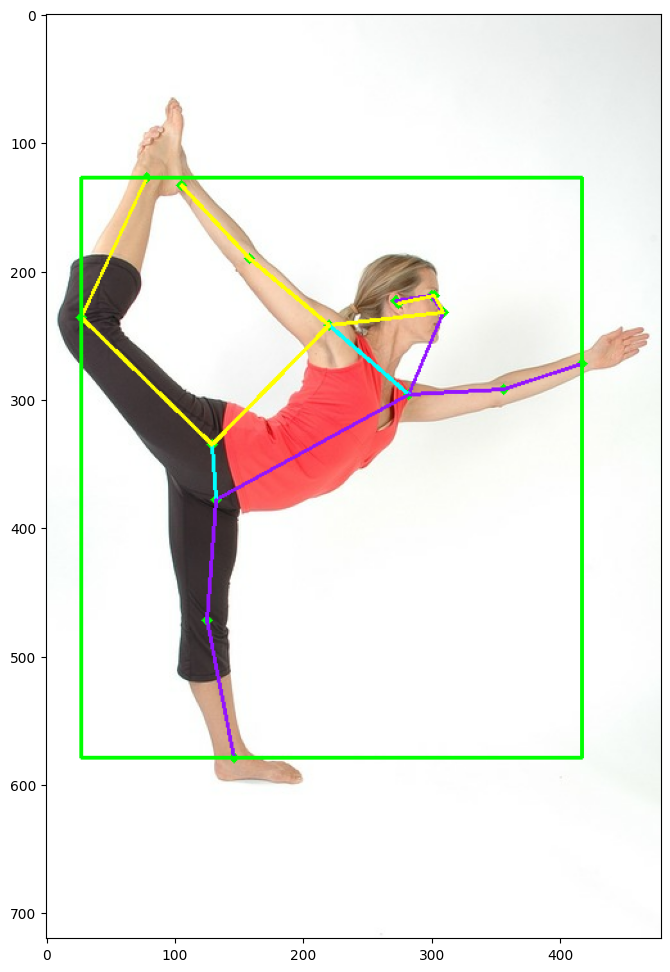

In [ ]:
# Code snippet to try out the MoveNet pose estimation logic
# You can download an image from the internet, run this code, and plot
# Useful for debugging

test_image_url = "https://cdn.pixabay.com/photo/2017/03/03/17/30/yoga-2114512_960_720.jpg" #@param {type:"string"}
!wget -O /tmp/image.jpeg {test_image_url}

if len(test_image_url):
  image = tf.io.read_file('/tmp/image.jpeg')
  image = tf.io.decode_jpeg(image)
  person = detect(image)
  _ = draw_prediction_on_image(image.numpy(), person, crop_region=None, 
                               close_figure=False, keep_input_size=True)

In [ ]:
# Training Set
images_in_train_folder = "/content/drive/MyDrive/content/cleaned/DATASET/TRAIN/"
images_out_train_folder = 'poses_images_out_train'
csvs_out_train_path = 'train_data.csv'

preprocessor = MoveNetPreprocessor(
    images_in_folder=images_in_train_folder,
    images_out_folder=images_out_train_folder,
    csvs_out_path=csvs_out_train_path,
)

preprocessor.process(per_pose_class_limit=None)

# Test Set
images_in_test_folder = "/content/drive/MyDrive/content/cleaned/DATASET/TEST/"
images_out_test_folder = 'poses_images_out_test'
csvs_out_test_path = 'test_data.csv'

preprocessor = MoveNetPreprocessor(
    images_in_folder=images_in_test_folder,
    images_out_folder=images_out_test_folder,
    csvs_out_path=csvs_out_test_path,
)

preprocessor.process(per_pose_class_limit=None)

Preprocessing downdog
100%|██████████| 223/223 [12:28<00:00,  3.35s/it]
Preprocessing goddess
 69%|██████▉   | 123/178 [07:00<03:12,  3.49s/it]/usr/local/lib/python3.9/dist-packages/numpy/lib/function_base.py:495: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/usr/local/lib/python3.9/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 178/178 [10:16<00:00,  3.46s/it]
Preprocessing plank
100%|██████████| 264/264 [14:52<00:00,  3.38s/it]
Preprocessing tree
100%|██████████| 159/159 [09:01<00:00,  3.40s/it]
Preprocessing warrior2
100%|██████████| 250/250 [14:16<00:00,  3.43s/it]


Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downdog/00000147.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downdog/00000168.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downdog/00000188.png. Image isn't in RGB format.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downdog/00000194.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downdog/00000212.png. Image isn't in RGB format.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downdog/00000218.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downdog/00000220.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downdog/00000221.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TRAIN/downd

Preprocessing downdog
100%|██████████| 97/97 [05:41<00:00,  3.52s/it]
Preprocessing goddess
100%|██████████| 77/77 [04:36<00:00,  3.60s/it]
Preprocessing plank
100%|██████████| 114/114 [06:30<00:00,  3.43s/it]
Preprocessing tree
 86%|████████▌ | 59/69 [03:40<00:36,  3.63s/it]/usr/local/lib/python3.9/dist-packages/numpy/lib/function_base.py:495: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/usr/local/lib/python3.9/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
100%|██████████| 69/69 [04:13<00:00,  3.67s/it]
Preprocessing warrior2
100%|██████████| 109/109 [06:13<00:00,  3.42s/it]

Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000010.png. Image isn't in RGB format.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000017.png. Image isn't in RGB format.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000035.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000041.png. Image isn't in RGB format.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000042.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000075.png. Image isn't in RGB format.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000080.jpg. No pose was confidentally detected.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000102.png. Image isn't in RGB format.
Skipped /content/drive/MyDrive/content/cleaned/DATASET/TEST/downdog/00000120.jpg. No pose was confide

In [ ]:
def load_pose_landmarks(csv_path):
  """Loads a CSV created by MoveNetPreprocessor.
  
  Returns:
    X: Detected landmark coordinates and scores of shape (N, 17 * 3)
    y: Ground truth labels of shape (N, label_count)
    classes: The list of all class names found in the dataset
    dataframe: The CSV loaded as a Pandas dataframe features (X) and ground
      truth labels (y) to use later to train a pose classification model.
  """

  # Load the CSV file
  dataframe = pd.read_csv(csv_path)
  df_to_process = dataframe.copy()

  # Drop the file_name columns as you don't need it during training.
  df_to_process.drop(columns=['file_name'], inplace=True)

  # Extract the list of class names
  classes = df_to_process.pop('class_name').unique()

  # Extract the labels
  y = df_to_process.pop('class_no')

  # Convert the input features and labels into the correct format for training.
  X = df_to_process.astype('float64')
  y = keras.utils.to_categorical(y)

  return X, y, classes, dataframe
  
# Load the train data
X, y, class_names, _ = load_pose_landmarks(csvs_out_train_path)

# Split training data (X, y) into (X_train, y_train) and (X_val, y_val)
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.15)

# Load the test data
X_test, y_test, _, df_test = load_pose_landmarks(csvs_out_test_path)

In [ ]:
def get_center_point(landmarks, left_bodypart, right_bodypart):
  """Calculates the center point of the two given landmarks."""

  left = tf.gather(landmarks, left_bodypart.value, axis=1)
  right = tf.gather(landmarks, right_bodypart.value, axis=1)
  center = left * 0.5 + right * 0.5
  return center


def get_pose_size(landmarks, torso_size_multiplier=2.5):
  """Calculates pose size.
  It is the maximum of two values:
    * Torso size multiplied by `torso_size_multiplier`
    * Maximum distance from pose center to any pose landmark
  """
  # Hips center
  hips_center = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                 BodyPart.RIGHT_HIP)

  # Shoulders center
  shoulders_center = get_center_point(landmarks, BodyPart.LEFT_SHOULDER,
                                      BodyPart.RIGHT_SHOULDER)

  # Torso size as the minimum body size
  torso_size = tf.linalg.norm(shoulders_center - hips_center)

  # Pose center
  pose_center_new = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                     BodyPart.RIGHT_HIP)
  pose_center_new = tf.expand_dims(pose_center_new, axis=1)
  # Broadcast the pose center to the same size as the landmark vector to
  # perform substraction
  pose_center_new = tf.broadcast_to(pose_center_new,
                                    [tf.size(landmarks) // (17*2), 17, 2])

  # Dist to pose center
  d = tf.gather(landmarks - pose_center_new, 0, axis=0,
                name="dist_to_pose_center")
  # Max dist to pose center
  max_dist = tf.reduce_max(tf.linalg.norm(d, axis=0))

  # Normalize scale
  pose_size = tf.maximum(torso_size * torso_size_multiplier, max_dist)

  return pose_size


def normalize_pose_landmarks(landmarks):
  """Normalizes the landmarks translation by moving the pose center to (0,0) and
  scaling it to a constant pose size.
  """
  # Move landmarks so that the pose center becomes (0,0)
  pose_center = get_center_point(landmarks, BodyPart.LEFT_HIP, 
                                 BodyPart.RIGHT_HIP)
  pose_center = tf.expand_dims(pose_center, axis=1)
  # Broadcast the pose center to the same size as the landmark vector to perform
  # substraction
  pose_center = tf.broadcast_to(pose_center, 
                                [tf.size(landmarks) // (17*2), 17, 2])
  landmarks = landmarks - pose_center

  # Scale the landmarks to a constant pose size
  pose_size = get_pose_size(landmarks)
  landmarks /= pose_size

  return landmarks


def landmarks_to_embedding(landmarks_and_scores):
  """Converts the input landmarks into a pose embedding."""
  # Reshape the flat input into a matrix with shape=(17, 3)
  reshaped_inputs = keras.layers.Reshape((17, 3))(landmarks_and_scores)

  # Normalize landmarks 2D
  landmarks = normalize_pose_landmarks(reshaped_inputs[:, :, :2])

  # Flatten the normalized landmark coordinates into a vector
  embedding = keras.layers.Flatten()(landmarks)

  return embedding

In [ ]:
# Define the model
inputs = tf.keras.Input(shape=(51))
embedding = landmarks_to_embedding(inputs)

layer = keras.layers.Dense(128, activation=tf.nn.relu6)(embedding)
layer = keras.layers.Dropout(0.5)(layer)
layer = keras.layers.Dense(64, activation=tf.nn.relu6)(layer)
layer = keras.layers.Dropout(0.5)(layer)
outputs = keras.layers.Dense(len(class_names), activation="softmax")(layer)

model = keras.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Add a checkpoint callback to store the checkpoint that has the highest
# validation accuracy.
checkpoint_path = "weights.best.hdf5"
checkpoint = keras.callbacks.ModelCheckpoint(checkpoint_path,
                             monitor='val_accuracy',
                             verbose=1,
                             save_best_only=True,
                             mode='max')
earlystopping = keras.callbacks.EarlyStopping(monitor='val_accuracy', 
                                              patience=20)

# Start training
history = model.fit(X_train, y_train,
                    epochs=200,
                    batch_size=16,
                    validation_data=(X_val, y_val),
                    callbacks=[checkpoint, earlystopping])
                    
# Evaluate the model using the TEST dataset
loss, accuracy = model.evaluate(X_test, y_test)

Epoch 1/200
38/51 [=====================>........] - ETA: 0s - loss: 1.5523 - accuracy: 0.4145
Epoch 1: val_accuracy improved from -inf to 0.63889, saving model to weights.best.hdf5
51/51 [==============================] - 2s 13ms/step - loss: 1.5282 - accuracy: 0.4287 - val_loss: 1.3720 - val_accuracy: 0.6389
Epoch 2/200
41/51 [=======================>......] - ETA: 0s - loss: 1.2820 - accuracy: 0.5655
Epoch 2: val_accuracy improved from 0.63889 to 0.66667, saving model to weights.best.hdf5
51/51 [==============================] - 0s 5ms/step - loss: 1.2525 - accuracy: 0.5700 - val_loss: 1.0095 - val_accuracy: 0.6667
Epoch 3/200
40/51 [======================>.......] - ETA: 0s - loss: 1.0570 - accuracy: 0.5953
Epoch 3: val_accuracy did not improve from 0.66667
51/51 [==============================] - 0s 4ms/step - loss: 1.0386 - accuracy: 0.5971 - val_loss: 0.8073 - val_accuracy: 0.6319
Epoch 4/200
43/51 [========================>.....] - ETA: 0s - loss: 0.8851 - accuracy: 0.6424
Epoc

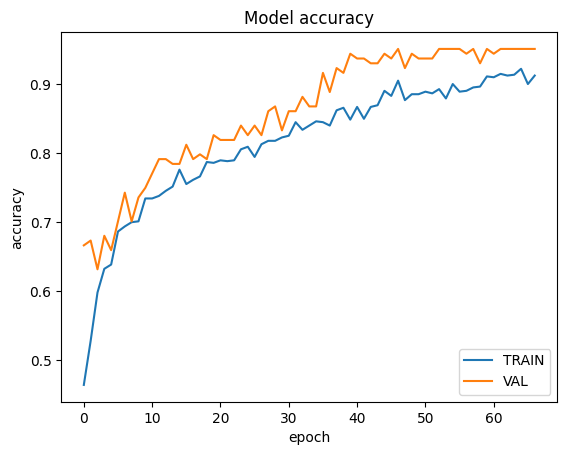

In [ ]:
# Visualize the training history to see whether you're overfitting.
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['TRAIN', 'VAL'], loc='lower right')
plt.show()

In [ ]:
# Evaluate the model using the TEST dataset
loss, accuracy = model.evaluate(X_test, y_test)

14/14 [==============================] - 1s 4ms/step - loss: 0.1963 - accuracy: 0.9654


14/14 [==============================] - 0s 3ms/step
Confusion matrix, without normalization

Classification Report:
               precision    recall  f1-score   support

     downdog       1.00      0.99      0.99        87
     goddess       0.98      0.84      0.91        74
       plank       0.98      0.99      0.99       106
        tree       0.97      1.00      0.98        64
    warrior2       0.91      0.99      0.95       103

    accuracy                           0.97       434
   macro avg       0.97      0.96      0.96       434
weighted avg       0.97      0.97      0.96       434



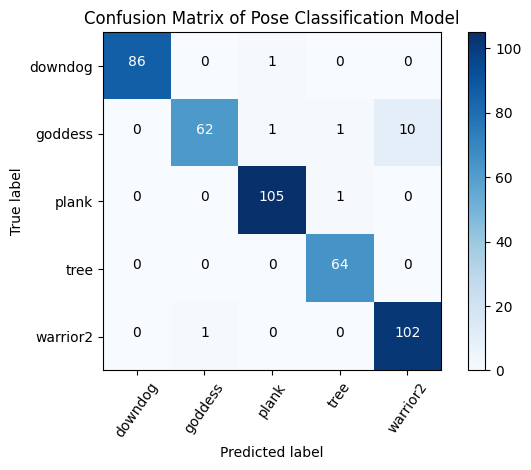

In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
  """Plots the confusion matrix."""
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print("Normalized confusion matrix")
  else:
    print('Confusion matrix, without normalization')

  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title(title)
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=55)
  plt.yticks(tick_marks, classes)
  fmt = '.2f' if normalize else 'd'
  thresh = cm.max() / 2.
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, format(cm[i, j], fmt),
              horizontalalignment="center",
              color="white" if cm[i, j] > thresh else "black")

  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  plt.tight_layout()

# Classify pose in the TEST dataset using the trained model
y_pred = model.predict(X_test)

# Convert the prediction result to class name
y_pred_label = [class_names[i] for i in np.argmax(y_pred, axis=1)]
y_true_label = [class_names[i] for i in np.argmax(y_test, axis=1)]

# Plot the confusion matrix
cm = confusion_matrix(np.argmax(y_test, axis=1), np.argmax(y_pred, axis=1))
plot_confusion_matrix(cm,
                      class_names,
                      title ='Confusion Matrix of Pose Classification Model')

# Print the classification report
print('\nClassification Report:\n', classification_report(y_true_label,
                                                          y_pred_label))

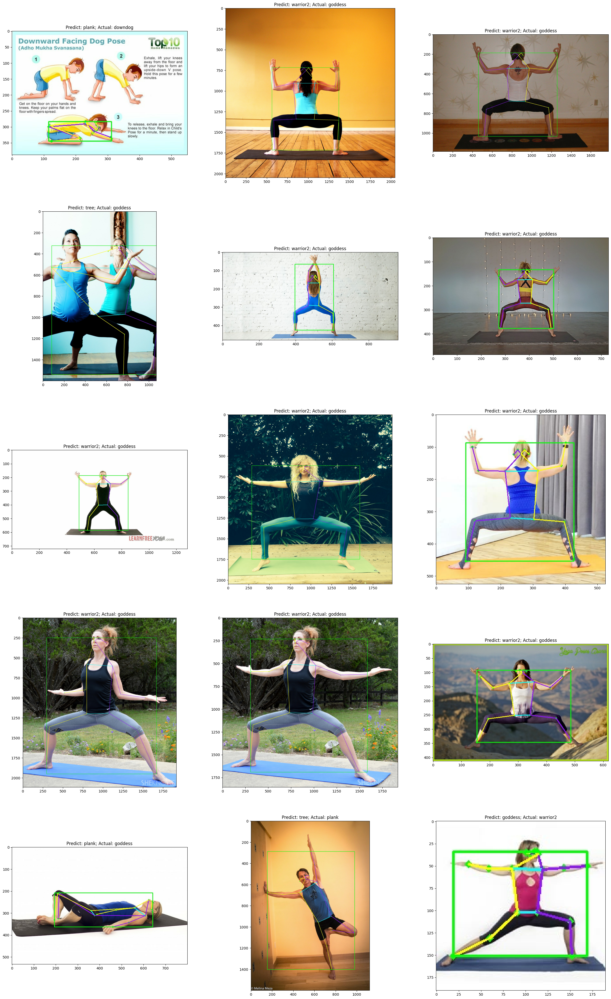

In [ ]:


# If step 1 was skipped, skip this step.
IMAGE_PER_ROW = 3
MAX_NO_OF_IMAGE_TO_PLOT = 30

# Extract the list of incorrectly predicted poses
false_predict = [id_in_df for id_in_df in range(len(y_test)) \
                if y_pred_label[id_in_df] != y_true_label[id_in_df]]
if len(false_predict) > MAX_NO_OF_IMAGE_TO_PLOT:
  false_predict = false_predict[:MAX_NO_OF_IMAGE_TO_PLOT]

# Plot the incorrectly predicted images
row_count = len(false_predict) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))
for i, id_in_df in enumerate(false_predict):
  ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
  image_path = os.path.join(images_out_test_folder,
                            df_test.iloc[id_in_df]['file_name'])

  image = cv2.imread(image_path)
  plt.title("Predict: %s; Actual: %s"
            % (y_pred_label[id_in_df], y_true_label[id_in_df]))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

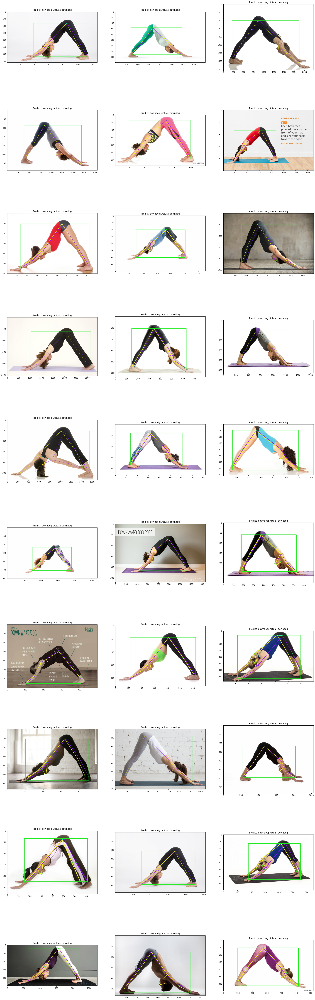

In [ ]:
# If step 1 was skipped, skip this step.
IMAGE_PER_ROW = 3
MAX_NO_OF_IMAGE_TO_PLOT = 30

# Extract the list of correctly predicted poses
true_predict = [id_in_df for id_in_df in range(len(y_test)) \
                if y_pred_label[id_in_df] == y_true_label[id_in_df]]
if len(true_predict) > MAX_NO_OF_IMAGE_TO_PLOT:
  true_predict = true_predict[:MAX_NO_OF_IMAGE_TO_PLOT]

# Plot the correctly predicted images
row_count = len(true_predict) // IMAGE_PER_ROW + 1
fig = plt.figure(figsize=(10 * IMAGE_PER_ROW, 10 * row_count))
for i, id_in_df in enumerate(true_predict):
  ax = fig.add_subplot(row_count, IMAGE_PER_ROW, i + 1)
  image_path = os.path.join(images_out_test_folder,
                            df_test.iloc[id_in_df]['file_name'])

  image = cv2.imread(image_path)
  plt.title("Predict: %s; Actual: %s"
            % (y_pred_label[id_in_df], y_true_label[id_in_df]))
  plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()
